In [9]:
import os 
root_path ="D:\\Master\\S2\\TER\\analyse\\src"
rez_files = os.path.join(root_path,"rez")

In [10]:
import pandas as pd
from os import listdir
from os.path import isfile, join
plot_path = os.path.join(root_path,"plot")
from matplotlib import pyplot as plt

In [11]:
lst_col = ['LOST_LIFE','LIFE','WEAPON_DEG','CHIP_DEG','MAPS','CHIP_ID','WEAPON_ID','MOVE_TO']
_cols = ['MOVE_TO','MAPS','WEAPON_ID','CHIP_ID']
id_col = ['ID_GEN','ID_FIGHT','ID_ENTITY','ID_TURN']
deg_col = ['LOST_LIFE','LIFE','WEAPON_DEG','CHIP_DEG']
audit_col = ["ACTIONS"]
coord_col =['MOVE_TO','MAPS']

In [117]:
'''
path__e = "D:\\Master\\S2\\TER\\analyse\\src\\rez\\WEAPON_ID\\0.csv"
df= pd.read_csv(path__e,sep=";",encoding="utf-8")
for i in range (len(df["41"].values)):
    df.loc[i,"41"] =0.0
    
df.to_csv(path__e ,sep=";",encoding="utf-8")
'''

'\npath__e = "D:\\Master\\S2\\TER\\analyse\\src\\rez\\WEAPON_ID\\0.csv"\ndf= pd.read_csv(path__e,sep=";",encoding="utf-8")\nfor i in range (len(df["41"].values)):\n    df.loc[i,"41"] =0.0\n    \ndf.to_csv(path__e ,sep=";",encoding="utf-8")\n'

In [114]:
'''
import json
path__ = "D:\\Master\\S2\\TER\\analyse\\src\\rez\\WEAPON_ID"
all_item_weapon = ["182.0","41.0"]
col_files = [f for f in listdir(path__) if isfile(join(path__, f))]
for file in col_files:
    weapon_path = os.path.join(path__,file)
    df= pd.read_csv(weapon_path,sep=";",encoding="utf-8",index_col=[0])
    _lst = df.columns[:28].tolist()
    _df = df.drop(_lst, axis=1)
    

    
    to_append_col = [col_i for col_i in all_item_weapon if not(col_i in _df.columns)]

    _df[to_append_col] = np.nan
    cols= _df.columns

    new_cols = cols[2:].tolist()+cols[:2].tolist()
    _df_2= _df[new_cols]
    _df_2[np.isnan(_df_2)] = 0
    _df_2.columns = [str(int(float(_col ))) for _col in _df_2.columns[:-2]  ]+_df_2.columns[-2:].tolist()
    _df_2.to_csv(weapon_path ,sep=";",encoding="utf-8")
'''

In [12]:
def _fu():
    ids_cols=["PART_GEN","PART_TURN"]
    
    for str_col in lst_col[:-1]:
        final_df_maps=None
        col_path = os.path.join(rez_files,str_col)
        col_files = [f for f in listdir(col_path) if isfile(join(col_path, f))]
        group_cols=["PART_GEN"] if str_col in coord_col else ids_cols
        for file in col_files:
            path_file = os.path.join(col_path,file)
            df_maps= pd.read_csv(path_file,sep=";",encoding="utf-8",index_col=[0])


            drop_cols = [c for c in ids_cols if (not c in group_cols)]
            df_maps=df_maps.drop(drop_cols, axis=1)
            grouped= df_maps.groupby(group_cols)

            final_df_maps = pd.DataFrame( columns=df_maps.columns) if final_df_maps is None else final_df_maps
            col_value = [e for e in df_maps.columns if not ( e in ids_cols)]
            for name, group in grouped:
                if isinstance(name,list) : 
                    __lst = [ name[i] for i in range(len(group_cols)) ] 

                else :
                    __lst = [name]
                    if(isinstance(name,tuple)):
                        __lst = list(*__lst)


                try:
                    if str_col in deg_col : 
                        final_df_maps.loc[len(final_df_maps)]=  group[col_value].mean().values.tolist()+ __lst
                    else:
                        final_df_maps.loc[len(final_df_maps)]=  group[col_value].sum().values.tolist()+ __lst
                except:
                    print(str_col)
                    print( __lst)
                    print(group[col_value].sum().values.tolist()+ __lst)
                    print(final_df_maps.columns)
                    return 0

        grouped= final_df_maps.groupby(group_cols)
        total_df= pd.DataFrame( columns=final_df_maps.columns)
       
        for name, group in grouped:
            if isinstance(name,list) : 
                __lst = [ name[i] for i in range(len(group_cols)) ] 
            else :
                __lst = [name]
                if(isinstance(name,tuple)):
                        __lst = list(*__lst)

            try:
                if str_col in deg_col :
                    total_df.loc[len(total_df)]=  group[col_value].mean().values.tolist()+__lst
                else:
                    total_df.loc[len(total_df)]=  group[col_value].sum().values.tolist()+__lst
            except:
                print(str_col)
                print( __lst)
                print(group[col_value].sum().values.tolist()+__lst)
                print(total_df.columns)
                return 1

        if str_col in  _cols  :

            lst_pos=to_dct_group(total_df)
            if str_col in coord_col :
                convert_lst = convert_tocoordMap(lst_pos) 
                toHeatMap(os.path.join(plot_path,str_col),convert_lst)
            elif str_col in _cols : #ID_WEAPON , ID_CHIPS
                df_to_plot(os.path.join(plot_path,str_col),pd.DataFrame.from_dict(lst_pos),-len(group_cols),str_col)
        elif str_col in deg_col : 
            _means = ["MEAN","VAR","STD"]
            df_to_plot_2(os.path.join(plot_path,str_col),total_df,_means.index("MEAN"),"PART_GEN",'_'.join([str_col,"MEAN"]),)
        else :
            print("RIEN",str_col)
        


In [ ]:
_fu()

In [2]:
def df_to_plot(s_path,total_df,end_idx_col,x_label,y_label="Occurence",idx_pGenTurn=[-2,-1]):
    display(total_df)
    for index, row in total_df.iterrows():
            print(row)
            plt.plot(row.index[:end_idx_col].tolist() , row.values[:end_idx_col].tolist())
            fig = plt.figure()
            plt.xlabel(x_label)
            plt.ylabel(y_label)
            title_ = "PGEN_"+str(int(row.values[idx_pGenTurn[0]]))+"_PTURN_"+str(int(row.values[idx_pGenTurn[1]]))
            plt.title( title_)
            #axis[int(row.values[1])].set_title("( GEN_"+str(row.values[0]) + " : "+"TURN_"+str(row.values[1])+" )" )
            f_str = title_+".png"
            fig.savefig(os.path.join(s_path,f_str), dpi=fig.dpi)
            plt.figure().clear()
            plt.close()
            plt.cla()
            plt.clf()

In [1]:
def df_to_plot_2(s_path,total_df,end_idx_col,x_label,y_label="Occurence",idx_pGenTurn=[-2,-1]):
            grouped= total_df.groupby("PART_TURN")
            _df= pd.DataFrame( columns= total_df.columns)
       
            gen_col = total_df.columns[idx_pGenTurn[0]]
            val_col= total_df.columns[end_idx_col]
            for name, group in grouped:
                fig = plt.figure()
                plt.plot( group[gen_col].tolist() , group[val_col].tolist())
                plt.xlabel(x_label)
                plt.ylabel(y_label)
                title_ = "PTURN_"+str(name)
                plt.title( title_)
                #axis[int(row.values[1])].set_title("( GEN_"+str(row.values[0]) + " : "+"TURN_"+str(row.values[1])+" )" )
                f_str = title_+".png"
                fig.savefig(os.path.join(s_path,f_str), dpi=fig.dpi)
                plt.figure().clear()
                plt.close()
                plt.cla()
                plt.clf()
            

In [8]:
cols_to_drop = [col for col in df_maps.columns if  not( col in df_maps.columns[:614] )]

NameError: name 'df_maps' is not defined

In [ ]:
df_maps_clean = df_maps.drop(cols_to_drop, axis=1)

In [ ]:
df_maps_clean= df_maps_clean.reset_index()

In [ ]:
col_to_keep = [str(i) for i in range(612)]

In [ ]:
final_df_maps = pd.DataFrame( columns=["PART_GEN","PART_TURN"]+col_to_keep)

In [ ]:
grouped= df_maps_clean.groupby(["PART_GEN","PART_TURN"])
for name, group in grouped:
    final_df_maps.loc[len(final_df_maps)]=[name[0] , name[1] ]+  group[col_to_keep].sum().values.tolist()

In [ ]:
f_group = final_df_maps.groupby(["PART_GEN"])

gen_group  = pd.DataFrame( columns=[x for x in  final_df_maps.columns if x != "PART_GEN"])
for name, group in f_group:
    gen_group.loc[len(gen_group)]=[name ]+  group[col_to_keep].sum().values.tolist()


In [170]:
gen_group.iloc[1,0]

7.0

In [193]:
display(final_df_maps)

,PART_GEN,PART_TURN,0,1,2,3,4,5,6,7,...,602,603,604,605,606,607,608,609,610,611
0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,6.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,6.0,2.0,0.0,108.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,6.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,6.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
869,65.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
870,65.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
871,65.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
872,65.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [3]:
def to_dct_group(gen_group):
    lst_pos = dict()
    i=0
    for c in  gen_group.columns:
        if(c.isnumeric()):
            i=0
            for v in gen_group[c]:
                gen_num=gen_group.iloc[i,-1]
                #print(i)
                if(v>0):
                    if(gen_num not in lst_pos ):
                        lst_pos.update({gen_num:dict()})
                    if(c not in lst_pos[gen_num] ):
                            lst_pos[gen_num][c]=v
                    else:
                        lst_pos[gen_num][c]+=v
                i+=1
    return lst_pos


In [4]:
def _fx(z):
    return (-((306-z)+289)/35,(289-(306-z))/35)
def _fy(z):
    min_x , max_x = _fx(z)
    min_x = int(min_x)
    max_x = int(max_x)
    for x in range(min_x ,max_x+1):
        y = (-18*x-(306-z))/17
        y=int(y)
        if((abs(x)+abs(y)<=17) and z==(306+18*x+17*y)) :
            return(x,y)

In [5]:
def convert_tocoordMap(lst_pos):
    convert_lst = dict()
    for _k in lst_pos.keys() :
        dct_tmp = dict()
        for k ,v in lst_pos[_k].items():
            dct_tmp.update({_fy(int(k)):v})
        convert_lst.update({_k:dct_tmp})
    return convert_lst
    

In [6]:
from collections import Counter
import seaborn as sns
import matplotlib.pyplot as plt

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

In [ ]:
plot_path = os.path.join(root_path,"plot")
path_move = os.path.join(plot_path ,"MOVES")
os.mkdir(path_move)

In [8]:
def toHeatMap(s_path,convert_lst):
    map_list =Counter()
    for x in range(612):
        map_list.update({_fy(x):0})
    for _k in convert_lst.keys():
            dct_tm = map_list.copy()
            dct_tm.update(Counter(convert_lst[_k]))
            ser = pd.Series(list(dct_tm.values()),
            index=pd.MultiIndex.from_tuples(list(dct_tm.keys())))
            df = ser.unstack().fillna(0)
            sns_plot = sns.heatmap(df)
            fig = sns_plot.get_figure()
            fig.savefig(os.path.join(s_path,"PGEN"+str(_k)+".png"))
            plt.figure().clear()
            plt.close()
            plt.cla()
            plt.clf()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
print(len(final_df_maps))

In [67]:
maps_path = os.path.join(plot_path,"MAPS")
os.mkdir(maps_path)

In [ ]:
os.path.join(maps_path,f_str)

C:\Users\julien\AppData\Local\Temp\ipykernel_7568\3216777930.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


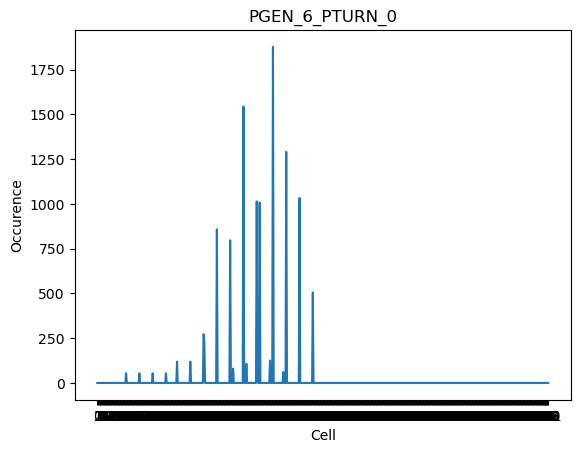

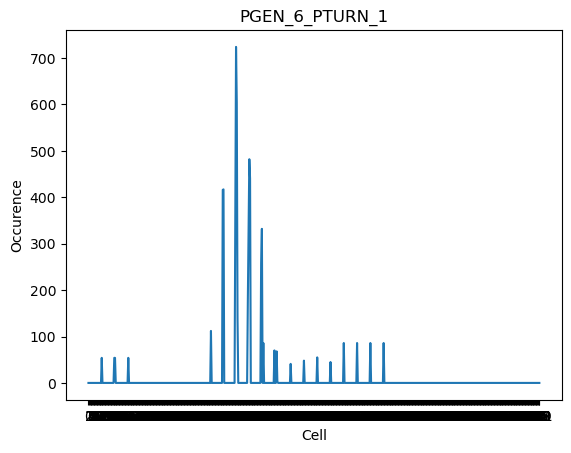

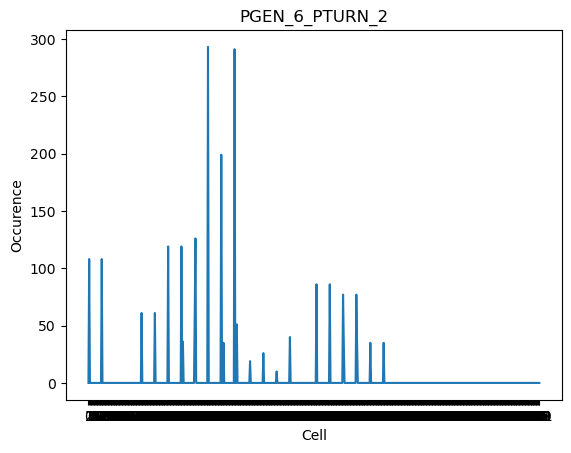

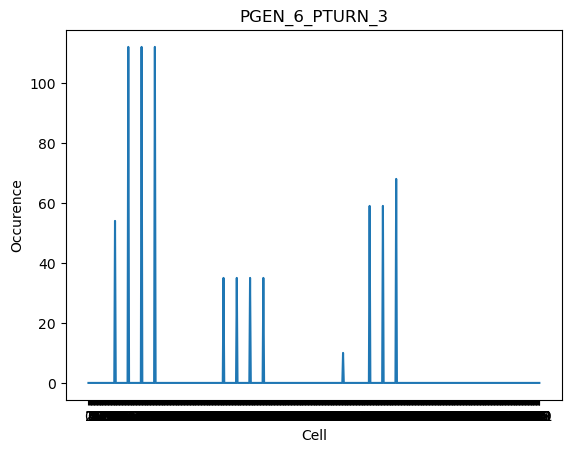

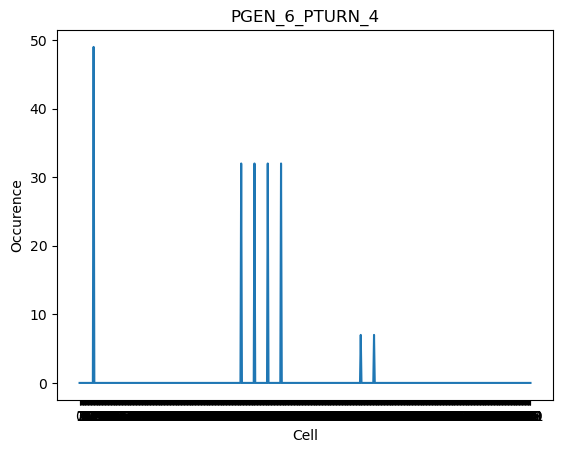

...

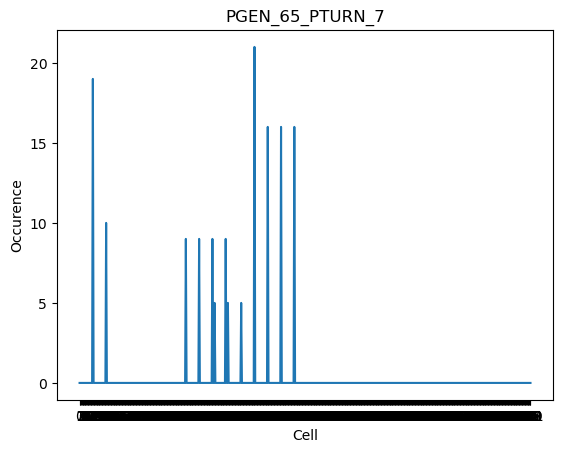

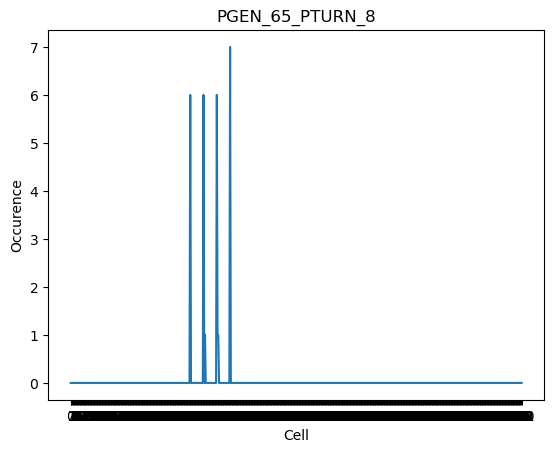

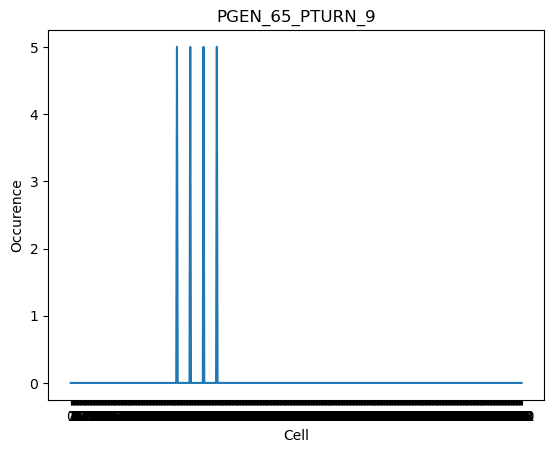

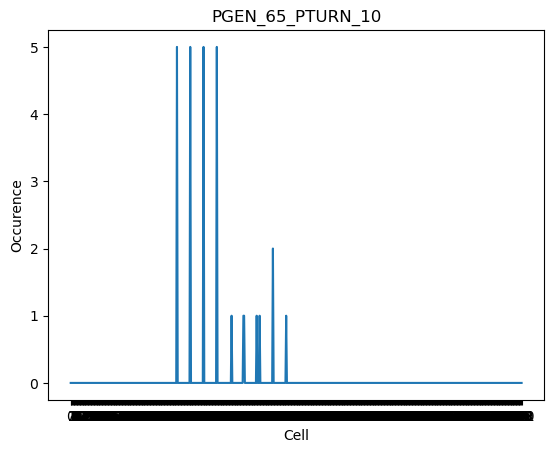

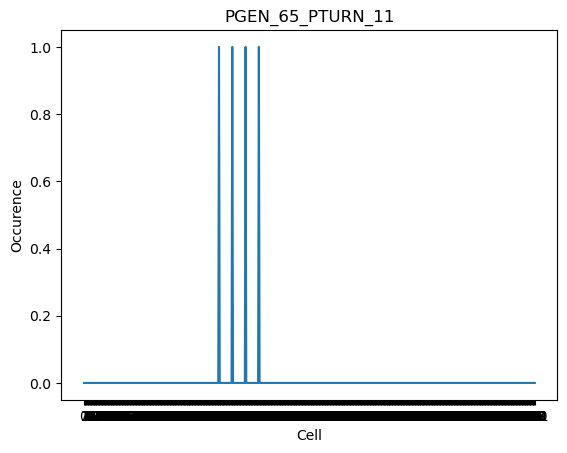

In [211]:
for index, row in final_df_maps.iterrows():
    fig = plt.figure()
    plt.plot(row.index[2:].tolist() , row.values[2:].tolist())
    plt.xlabel("Cell")
    plt.ylabel('Occurence')
    title_ = "PGEN_"+str(int(row.values[0]))+"_PTURN_"+str(int(row.values[1]))
    plt.title( title_)
    #axis[int(row.values[1])].set_title("( GEN_"+str(row.values[0]) + " : "+"TURN_"+str(row.values[1])+" )" )
    f_str = title_+".png"
    fig.savefig(os.path.join(maps_path,f_str), dpi=fig.dpi)

In [124]:
str_attribut = "CHIP_ID"
lifes_file = os.path.join(root_path,"rez\\"+str_attribut+".csv")

In [125]:
attribut_path = os.path.join(plot_path,str_attribut)

In [126]:
os.mkdir(attribut_path)

In [127]:
col_to_keep_lf=["MEAN"]
df_lifes= pd.read_csv(lifes_file,sep=";",encoding="utf-8",index_col=[0])

In [ ]:
final_df_lifes = pd.DataFrame( columns=["PART_GEN","PART_TURN"]+col_to_keep_lf)
grouped= df_lifes.groupby(["PART_GEN","PART_TURN"])
for name, group in grouped:
    final_df_lifes.loc[len(final_df_lifes)]=[name[0] , name[1] ]+  group[col_to_keep_lf].mean().values.tolist()

In [ ]:
final_df_lifes["PART_TURN"].max()

In [ ]:
turns = {i : {"vals":[],"gens":[]} for i in range(32)}
for index, row in final_df_lifes.iterrows():
    #print(row[2])
    last = turns[int(row[1])]["gens"][-1] if len(turns[int(row[1])]["gens"])> 0 else 0
    
    id_padding = [k for k in range(last , int(row[0]))]
    turns[int(row[1])]["gens"]+= id_padding
    turns[int(row[1])]["vals"]+=[0 for _ in range(len(id_padding))]
    turns[int(row[1])]["vals"].append(row[2])
    turns[int(row[1])]["gens"].append(int(row[0]))

In [ ]:

for k , v in turns.items():
    fig = plt.figure()
    plt.plot(v["gens"] , v["vals"])
    plt.xlabel("Generation")
    plt.ylabel('Id')
    
    title_ = "PTURN_"+str(k)
    plt.title( title_)
    f_str = title_+".png"
    fig.savefig(os.path.join(attribut_path,f_str), dpi=fig.dpi)
    
    

In [ ]:
plot_path = os.path.join(root_path,"plot")

for index, row in final_df_maps.iterrows():
    fig = plt.figure()
    plt.plot(row.index[2:].tolist() , row.values[2:].tolist())
    plt.xlabel("Cell")
    plt.ylabel('Occurence')
    #axis[int(row.values[1])].set_title("( GEN_"+str(row.values[0]) + " : "+"TURN_"+str(row.values[1])+" )" )
    f_str = "PGEN_"+str(int(row.values[0]))+"_PTURN_"+str(int(row.values[1]))+".png"
    fig.savefig(os.path.join(plot_path,f_str), dpi=fig.dpi)

In [189]:
lst_i = [ i for i in range(len(final_df_maps.columns)-1) ]


liste_i =[]
for i  in range(36) :
    i_i=i*2
    if i_i ==0 :
        liste_i += lst_i[18*i_i:18*(i_i+1)]
    else:
        liste_i += lst_i[18*i_i-i:18*(i_i+1)-i]
    


In [204]:
resultats = []
intitules =[]

def next_x ( _x):
    x_tmp =  _x +18
    return  x_tmp if x_tmp < 611 else None

def prev_x (_x):
    x_tmp =  _x - 18
    return  x_tmp if x_tmp >=0 else None

def next_y (_y):
    y_tmp =  _y +17
    return  y_tmp if y_tmp < 611 else None

def prev_y (_y):
    y_tmp =  _y -17
    return  y_tmp if y_tmp >=0 else None

def to_lst (_xy):
    if _xy is None :
        return []
    else :
        return [_xy]

    
def get_neighbors(i,j,df):
    lst_neigbors_ = [j ,next_y(j) ,prev_y(j) , next_x(j), prev_x(j) ]
    
    lst_neigbors=[]
    for jk in lst_neigbors_ :
        if not(jk is None):
            lst_neigbors.append(jk)

    lst_arr = []
    for _j in lst_neigbors :
        lst_arr.append(df[str(_j)][i] )
    return np.array(lst_arr )

    


for i in range(2, len(final_df_maps)-1):
    resultat=[]
    
    for k in liste_i[:-2]:
        j=k+2
        # Ajouter les valeurs des 4 cellules du carré
        arr_voisinage = get_neighbors(i,int(final_df_maps.columns[j]),final_df_maps)
        
        somme=np.mean(arr_voisinage, axis=0)
        intitules.append(final_df_maps.columns[j] + '-' + final_df_maps.columns[j+1] )
        

        resultat.append(somme)
    resultats.append(resultat)

In [214]:
len(final_df_maps)

229

In [212]:
df_final_ = pd.DataFrame(resultats,columns=list(set(intitules)))

In [215]:
df_final_

,211-212,323-324,115-116,527-528,397-398,9-10,458-459,259-260,325-326,492-493,...,420-421,564-565,175-176,291-292,116-117,180-181,262-263,393-394,105-106,210-211
0,4.000000,6.666667,2.666667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,5.000000,12.000000,1.666667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.666667,4.666667,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.666667,2.666667,0.666667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
222,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
223,105.333333,105.333333,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
224,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


C:\Users\julien\AppData\Local\Temp\ipykernel_23300\3402217895.py:2: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  for name, group in grouped:


GEN : 0


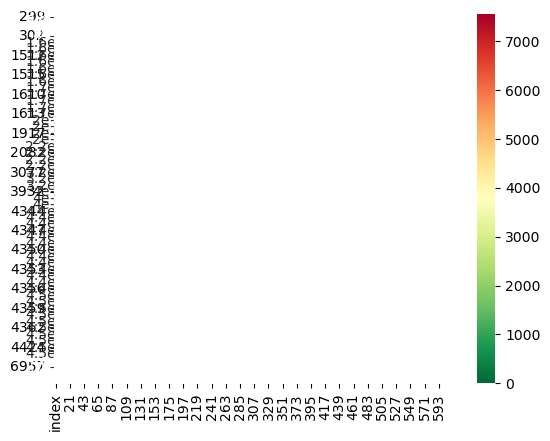

GEN : 7


KeyboardInterrupt: 

In [64]:
grouped= df_maps_clean.groupby(["PART_GEN"])
for name, group in grouped:
    print("GEN :"  , name)
    ax = sns.heatmap(group, cmap='RdYlGn_r', linewidths=0.5, annot=True)
    plt.show()